# H2HBABBA2250 
### Aim: Build a Machine Learning model to predict the date of payment of an invoice

In [1]:
#importing libraries
import pandas as pd
import numpy as np
import  matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split 
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

In [2]:
#reading dataset
data=pd.read_csv("H2HBABBA2250.csv")
untouched=data #copy of dataset 
data.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,area_business,total_open_amount,baseline_create_date,cust_payment_terms,invoice_id,isOpen
0,U001,200785971,SYSCO foundation,2019-07-18 00:00:00,2019.0,1.929571e+09,2019-07-02,20190703,20190702,20190717.0,USD,RV,1.0,NaN,19922.82,20190702.0,NAA8,1.929571e+09,0
1,U001,0200743123,KROGER in,2019-11-15 00:00:00,2019.0,1.930078e+09,2019-10-31,20191101,20191031,20191115.0,USD,RV,1.0,NaN,38332.25,20191031.0,NAA8,1.930078e+09,0
2,U001,0200772595,SAFEW corporation,NaN,2020.0,1.930704e+09,2020-03-25,20200326,20200325,20200409.0,USD,RV,1.0,NaN,73080.87,20200325.0,NAA8,1.930704e+09,1
3,U001,0200769623,WAL-MAR us,2019-04-30 00:00:00,2019.0,1.929168e+09,2019-04-19,20190418,20190419,20190504.0,USD,RV,1.0,NaN,25054.82,20190419.0,NAH4,1.929168e+09,0
4,U001,0200726979,BJ'S corp,2020-02-18 00:00:00,2020.0,1.930470e+09,2020-02-03,20200202,20200203,20200218.0,USD,RV,1.0,NaN,63.48,20200203.0,NAA8,1.930470e+09,0


In [3]:
data.shape
#total rows and columns

(50000, 19)

### Pre-processing
##### i) deleting null , duplicate and throughout-constant values
##### ii) maintaining datatypes suitable for model 
##### iii) creating target values

In [4]:
data.isnull().sum()
#total number of null rows in each columns

business_code                 0
cust_number                   0
name_customer                 0
clear_date                10000
buisness_year                 0
doc_id                        0
posting_date                  0
document_create_date          0
document_create_date.1        0
due_in_date                   0
invoice_currency              0
document type                 0
posting_id                    0
area_business             50000
total_open_amount             0
baseline_create_date          0
cust_payment_terms            0
invoice_id                    1
isOpen                        0
dtype: int64

In [5]:
data.dropna(how='all', inplace=True)
data.dropna(how='all', axis=1, inplace=True)
data.shape
#deleting null rows and columns

(50000, 18)

In [6]:
i=data.duplicated().sum()
#determines duplicate rows and deleting them
if (i!=0):
    data.drop_duplicates(keep='first', inplace=True)
data.shape

(48776, 18)

In [7]:
#posting_date:date format value 1
#document_create_date: int format value 2
#document_create_date1: int format value 1 
#baseline_create_date: float format value 1
#isOpen: int
data.dtypes

business_code              object
cust_number                object
name_customer              object
clear_date                 object
buisness_year             float64
doc_id                    float64
posting_date               object
document_create_date        int64
document_create_date.1      int64
due_in_date               float64
invoice_currency           object
document type              object
posting_id                float64
total_open_amount         float64
baseline_create_date      float64
cust_payment_terms         object
invoice_id                float64
isOpen                      int64
dtype: object

In [8]:
pd.to_datetime(data["posting_date"])
#converting to datetime 

0       2019-07-02
1       2019-10-31
2       2020-03-25
3       2019-04-19
4       2020-02-03
           ...    
49995   2020-01-29
49996   2020-01-30
49997   2019-10-03
49998   2019-04-03
49999   2019-09-09
Name: posting_date, Length: 48776, dtype: datetime64[ns]

In [9]:
#checking correlation between baseline_create_date document_create_date.1 document_create_date
col1=data["baseline_create_date"].astype(int)
col2=data["document_create_date.1"]
col3=data["document_create_date"]
col1.corr(col2)#almost similar data

0.9990645700784261

In [10]:
col2.corr(col3)#slight difference thus will considered the normalised date

0.9934558274446471

In [11]:
#dropping baseline_create_date and document_create_date
data.drop(['document_create_date', 'baseline_create_date'], axis=1, inplace=True)

In [12]:
data.shape

(48776, 16)

In [13]:
(data['doc_id'] == data['invoice_id']).value_counts()

True     48775
False        1
dtype: int64

In [14]:
data.loc[(data['doc_id']!= data['invoice_id'])]

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,invoice_currency,document type,posting_id,total_open_amount,cust_payment_terms,invoice_id,isOpen
13670,CA02,0140104225,SAVE-ON- systems,2019-05-08 00:00:00,2019.0,9.500000e+09,2019-03-29,20190306,20190316.0,CAD,X2,1.0,6636.96,CA10,NaN,0


In [15]:
#dropping invoice_id
data.drop('invoice_id', axis=1, inplace=True)

In [16]:
data.nunique()#unique values

business_code                 6
cust_number                1429
name_customer              4194
clear_date                  400
buisness_year                 2
doc_id                    48776
posting_date                506
document_create_date.1      506
due_in_date                 546
invoice_currency              2
document type                 2
posting_id                    1
total_open_amount         44178
cust_payment_terms           73
isOpen                        2
dtype: int64

In [17]:
data.drop('posting_id', axis=1, inplace=True)#drop column with single data through-out

In [18]:
#coverting due_in_date, posting_date and clear_date to datetime 
data['due_in_date'].dtypes

dtype('float64')

In [19]:
data['due_in_date']=data['due_in_date'].astype(int)

In [20]:
data['due_in_date']=data['due_in_date'].astype(str)

In [21]:
data['due_in_date']=pd.to_datetime(data['due_in_date'])

In [22]:
data['clear_date']=pd.to_datetime(data['clear_date'])
data['posting_date']=pd.to_datetime(data['posting_date'])

In [23]:
data.head()

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,isOpen
0,U001,200785971,SYSCO foundation,2019-07-18,2019.0,1.929571e+09,2019-07-02,20190702,2019-07-17,USD,RV,19922.82,NAA8,0
1,U001,0200743123,KROGER in,2019-11-15,2019.0,1.930078e+09,2019-10-31,20191031,2019-11-15,USD,RV,38332.25,NAA8,0
2,U001,0200772595,SAFEW corporation,NaT,2020.0,1.930704e+09,2020-03-25,20200325,2020-04-09,USD,RV,73080.87,NAA8,1
3,U001,0200769623,WAL-MAR us,2019-04-30,2019.0,1.929168e+09,2019-04-19,20190419,2019-05-04,USD,RV,25054.82,NAH4,0
4,U001,0200726979,BJ'S corp,2020-02-18,2020.0,1.930470e+09,2020-02-03,20200203,2020-02-18,USD,RV,63.48,NAA8,0


In [24]:
data['isOpen'].nunique()

2

#### Target column

In [25]:
#days in between clear_date and due_in_date = no. of days in delay
#data['target']=data['clear_date'].sub(data['due_in_date'],axis=0) => in timedelta form 
data['target']=data['clear_date']-data['due_in_date'] 
data['target']=data['target'].dt.days #in float form 
data['target']=data['target'].fillna(0)
data['target']=data['target'].astype(int) #in int form

In [26]:
#business year to int
data['buisness_year']=data['buisness_year'].astype(int)

In [27]:
#sorting dataframe on basis of posting_date in ascending order
data.sort_values(by='posting_date', ascending = True, inplace= True)

In [28]:
data0=data#with missing data rows in clear_date col
data.dropna(subset=['clear_date'],how='any', inplace=True)#deleting missing data in clear_date

In [29]:
data['isOpen'].nunique()

1

In [30]:
#deleting isOpen col because of constant value
data.drop('isOpen', axis=1, inplace=True)

In [31]:
if 'USD' in data['invoice_currency'].values :
    data['total_open_amount'] = data['total_open_amount'].apply(lambda x: x*0.81)
if 'USD' in data0['invoice_currency'].values :
    data0['total_open_amount'] = data0['total_open_amount'].apply(lambda x: x*0.81)    
#converting CAD into USD with the value 1 CAD = 0.81 USD

In [32]:
data[data['invoice_currency']!='USD']

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,invoice_currency,document type,total_open_amount,cust_payment_terms,target
42970,CA02,0140106408,WAL-M in,2019-01-25,2019,2.960520e+09,2018-12-30,20181230,2019-01-09,CAD,RV,1327.500252,CA10,16
10239,CA02,0140104423,METRO foundation,2019-01-15,2019,2.960519e+09,2018-12-31,20181231,2019-01-12,CAD,RV,50656.588704,CA10,3
16262,CA02,0140104423,METRO llc,2019-01-15,2019,2.960520e+09,2018-12-31,20181231,2019-01-14,CAD,RV,51695.424639,CA10,1
28197,CA02,0140104429,COSTCO foundation,2019-01-18,2019,2.960520e+09,2018-12-31,20181231,2019-01-19,CAD,RV,5864.339898,CA10,-1
28430,CA02,0140104429,COSTCO trust,2019-01-18,2019,2.960520e+09,2018-12-31,20181231,2019-01-13,CAD,RV,668.920194,CA10,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29210,CA02,0140105686,SYSC co,2020-03-19,2020,2.960616e+09,2020-02-26,20200226,2020-03-15,CAD,RV,1601.704125,CA10,4
28861,CA02,0140105686,SYSC co,2020-03-19,2020,2.960617e+09,2020-02-26,20200226,2020-03-15,CAD,RV,26036.200008,CA10,4
3594,CA02,0140104429,COSTCO in,2020-03-23,2020,2.960617e+09,2020-02-26,20200226,2020-03-07,CAD,RV,26375.174073,CA10,16
255,CA02,0140106408,WAL-M systems,2020-03-16,2020,2.960614e+09,2020-02-27,20200227,2020-03-10,CAD,RV,37840.068864,CA10,6


In [33]:
#droping invoice_currency col as all amounts are in USD
data.drop('invoice_currency', axis=1, inplace=True)

In [34]:
data.loc[(data['document type']!= 'RV')]

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,document type,total_open_amount,cust_payment_terms,target
13670,CA02,0140104225,SAVE-ON- systems,2019-05-08,2019,9.500000e+09,2019-03-29,20190306,2019-03-16,X2,4354.509456,CA10,53


In [35]:
if 'RV' in data['document type'].values :
    data['document type'] = 1
else:
    data['document type'] = 2
#RV=> 1
#X2=> 2
#manual encoding 

In [36]:
data.shape

(39082, 13)

#### extracting date, month and year from clear_date, posting_date and due_in_date 

In [37]:
data['posting_year'] = pd.DatetimeIndex(data['posting_date']).year
data['due_year'] = pd.DatetimeIndex(data['due_in_date']).year
data['clear_year'] = pd.DatetimeIndex(data['clear_date']).year

In [38]:
data['posting_month'] = pd.DatetimeIndex(data['posting_date']).month
data['due_month'] = pd.DatetimeIndex(data['due_in_date']).month
data['clear_month'] = pd.DatetimeIndex(data['clear_date']).month

In [39]:
data['posting_day'] =data['posting_date'].dt.day
data['due_day'] =data['due_in_date'].dt.day
data['clear_day'] =data['clear_date'].dt.day

In [40]:
data

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,document type,...,target,posting_year,due_year,clear_year,posting_month,due_month,clear_month,posting_day,due_day,clear_day
19014,U001,0200706844,WINC corporation,2019-01-14,2019,1.928543e+09,2018-12-30,20181230,2019-01-14,1,...,0,2018,2019,2019,12,1,1,30,14,14
41980,U001,0200769623,WAL-MAR systems,2019-01-09,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,...,-5,2018,2019,2019,12,1,1,30,14,9
40830,U001,0200771157,WEIS,2019-01-18,2019,1.928538e+09,2018-12-30,20181230,2019-01-14,1,...,4,2018,2019,2019,12,1,1,30,14,18
43090,U001,0200780849,LAUREL llc,2019-01-14,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,...,0,2018,2019,2019,12,1,1,30,14,14
44689,U001,CCU013,KRAFT F corporation,2019-03-01,2019,1.928517e+09,2018-12-30,20181230,2018-12-30,1,...,61,2018,2018,2019,12,12,3,30,30,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28199,U001,0200759878,SA co,2020-03-13,2020,1.930574e+09,2020-02-27,20200227,2020-03-13,1,...,0,2020,2020,2020,2,3,3,27,13,13
39288,U001,0200794332,COST trust,2020-03-12,2020,1.930577e+09,2020-02-27,20200227,2020-03-13,1,...,-1,2020,2020,2020,2,3,3,27,13,12
44982,U001,0200759878,SA systems,2020-03-13,2020,1.930570e+09,2020-02-27,20200227,2020-03-13,1,...,0,2020,2020,2020,2,3,3,27,13,13
10288,CA02,0140104950,MULT corporation,2020-03-09,2020,2.960617e+09,2020-02-27,20200227,2020-03-10,1,...,-1,2020,2020,2020,2,3,3,27,10,9


### Outliers 

In [41]:
#plotting and dealing with the outliner
data['target'].describe()

count    39082.000000
mean         0.879587
std         10.792043
min        -98.000000
25%         -3.000000
50%          0.000000
75%          2.000000
max        171.000000
Name: target, dtype: float64

<AxesSubplot:xlabel='target'>

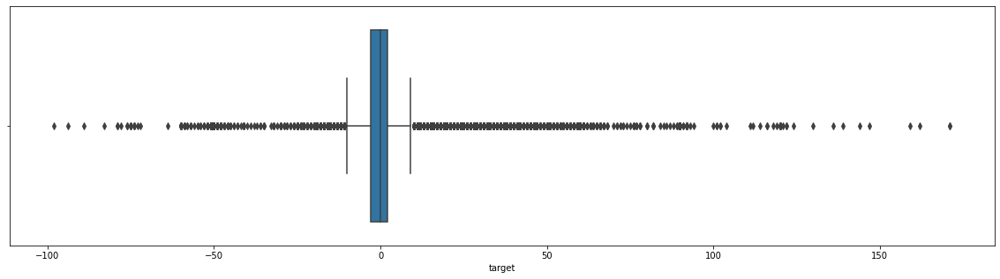

In [42]:
plt.subplots(figsize=(20,5))
sns.boxplot(data['target'])

In [43]:
# Creating a function for outliers
def fun(a):
    q1=a.quantile(0.25)
    q3=a.quantile(0.75)
    iqr=q3-q1
    low=q1-(1.5*iqr)
    high=q3+(1.5*iqr)
    a[a<low]=q1
    a[a>high]=q3
    return a

In [44]:
fun(data['target'])

19014    0
41980   -5
40830    4
43090    0
44689    2
        ..
28199    0
39288   -1
44982    0
10288   -1
45914    0
Name: target, Length: 39082, dtype: int32

In [45]:
data['target'].describe()

count    39082.000000
mean        -0.230925
std          3.246391
min        -10.000000
25%         -3.000000
50%          0.000000
75%          2.000000
max          9.000000
Name: target, dtype: float64

## splitting

In [46]:
train_size=0.8 #dividing 80:10:10 for train:valid:test
x = data.drop(columns = ['target']).copy() #remaining dataframe
y = data['target'] 
#splitting into training and remaining (80/20)
x_train, x_rest, y_train, y_rest = train_test_split(x,y, train_size=0.8)
#splitting into valid and test (50/50) from remaining (20=>10/10)
test_size = 0.5
x_valid, x_test, y_valid, y_test = train_test_split(x_rest,y_rest, test_size=0.5)

In [47]:
print(x_train.shape), print(y_train.shape) #80%
print(x_valid.shape), print(y_valid.shape) #10%
print(x_test.shape), print(y_test.shape) #10%

(31265, 21)
(31265,)
(3908, 21)
(3908,)
(3909, 21)
(3909,)


(None, None)

## EDA

In [48]:
import seaborn as sns

In [49]:
data.describe()

,buisness_year,doc_id,document_create_date.1,document type,total_open_amount,target,posting_year,due_year,clear_year,posting_month,due_month,clear_month,posting_day,due_day,clear_day
count,39082.000000,3.908200e+04,3.908200e+04,39082.0,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000,39082.000000
mean,2019.135715,2.012777e+09,2.019186e+07,1.0,21137.632756,-0.230925,2019.127143,2019.140397,2019.135715,5.708050,6.108874,6.191802,15.666778,15.910061,15.987437
std,0.342490,2.813156e+08,3.263773e+03,0.0,26131.978271,3.246391,0.341632,0.347845,0.342490,3.505598,3.475060,3.486016,8.760732,8.717051,8.916540
min,2019.000000,1.928488e+09,2.018123e+07,1.0,0.925101,-10.000000,2018.000000,2018.000000,2019.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2019.000000,1.929179e+09,2.019041e+07,1.0,3046.534740,-3.000000,2019.000000,2019.000000,2019.000000,2.000000,3.000000,3.000000,8.000000,8.000000,8.000000
50%,2019.000000,1.929732e+09,2.019072e+07,1.0,11365.010127,0.000000,2019.000000,2019.000000,2019.000000,5.000000,6.000000,6.000000,16.000000,16.000000,16.000000
75%,2019.000000,1.930212e+09,2.019103e+07,1.0,30380.544835,2.000000,2019.000000,2019.000000,2019.000000,9.000000,9.000000,9.000000,23.000000,24.000000,24.000000
max,2020.000000,9.500000e+09,2.020023e+07,1.0,403376.749146,9.000000,2020.000000,2020.000000,2020.000000,12.000000,12.000000,12.000000,31.000000,31.000000,31.000000


<AxesSubplot:xlabel='target', ylabel='Density'>

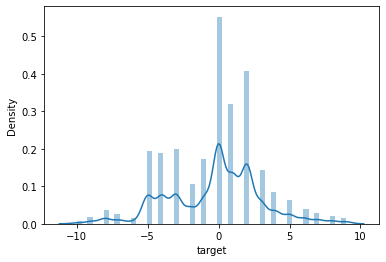

In [50]:
sns.distplot(y_train)
#no major skewness is observerd

<AxesSubplot:>

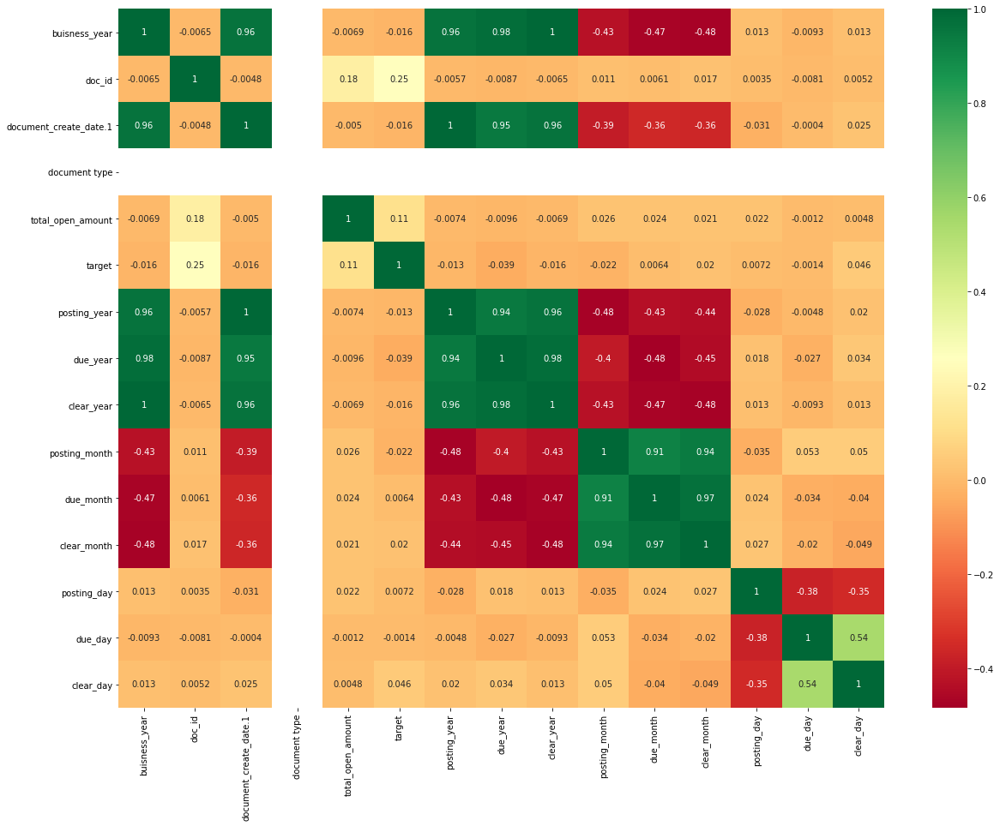

In [51]:
plt.subplots(figsize=(20,15))
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn')
# no prominent correlations except years

In [52]:
data.dtypes

business_code                     object
cust_number                       object
name_customer                     object
clear_date                datetime64[ns]
buisness_year                      int32
doc_id                           float64
posting_date              datetime64[ns]
document_create_date.1             int64
due_in_date               datetime64[ns]
document type                      int64
total_open_amount                float64
cust_payment_terms                object
target                             int32
posting_year                       int64
due_year                           int64
clear_year                         int64
posting_month                      int64
due_month                          int64
clear_month                        int64
posting_day                        int64
due_day                            int64
clear_day                          int64
dtype: object

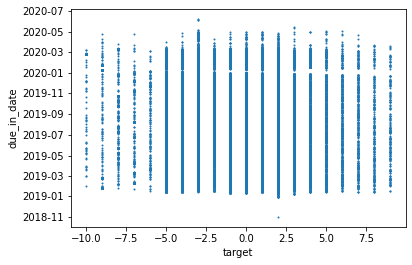

In [53]:
data.plot.scatter(x = 'target', y = 'due_in_date', s = 1);

<AxesSubplot:xlabel='target', ylabel='due_in_date'>

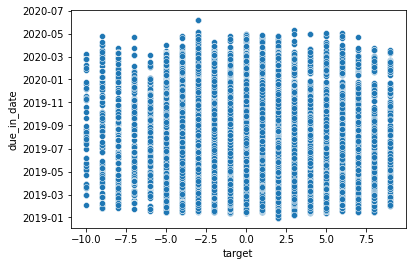

In [54]:
sns.scatterplot(data= x_train.merge(y_train,on = x_train.index), x="target", y="due_in_date")
#random distribution of variable 

## Feature Engineering

In [55]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31265 entries, 49791 to 38485
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   business_code           31265 non-null  object        
 1   cust_number             31265 non-null  object        
 2   name_customer           31265 non-null  object        
 3   clear_date              31265 non-null  datetime64[ns]
 4   buisness_year           31265 non-null  int32         
 5   doc_id                  31265 non-null  float64       
 6   posting_date            31265 non-null  datetime64[ns]
 7   document_create_date.1  31265 non-null  int64         
 8   due_in_date             31265 non-null  datetime64[ns]
 9   document type           31265 non-null  int64         
 10  total_open_amount       31265 non-null  float64       
 11  cust_payment_terms      31265 non-null  object        
 12  posting_year            31265 non-null  in

In [56]:
x_train.nunique()

business_code                 6
cust_number                1264
name_customer              3547
clear_date                  391
buisness_year                 2
doc_id                    31265
posting_date                423
document_create_date.1      423
due_in_date                 487
document type                 1
total_open_amount         28704
cust_payment_terms           69
posting_year                  3
due_year                      3
clear_year                    2
posting_month                12
due_month                    12
clear_month                  12
posting_day                  31
due_day                      31
clear_day                    31
dtype: int64

In [57]:
#dropping function 
def dropping(col , traindata= x_train, valdata= x_valid, testdata= x_test):
    traindata.drop(col, axis=1, inplace=True)
    valdata.drop(col, axis=1, inplace=True)
    testdata.drop(col, axis=1, inplace=True)
    return traindata,valdata,testdata

In [58]:
from sklearn.preprocessing import LabelEncoder
#encoding business_code 
buss_code_encoder= LabelEncoder()
buss_code_encoder.fit(x_train['business_code'])
x_train['business_code_encoded']= buss_code_encoder.transform(x_train['business_code'])
x_valid['business_code_encoded']= buss_code_encoder.transform(x_valid['business_code'])
x_test['business_code_encoded']= buss_code_encoder.transform(x_test['business_code'])

In [59]:
x_train,x_valid,x_test =dropping(['business_code'])

In [60]:
x_train['business_code_encoded'].nunique()
#still no hampering of data

6

In [61]:
#encoding cust_number
cust_no_encoder= LabelEncoder()
cust_no_encoder.fit(x_train['cust_number'])
x_train['cust_no_encoded']= cust_no_encoder.transform(x_train['cust_number'])
#for new customers in validation set
new_mem= set(x_valid['cust_number'])-set(cust_no_encoder.classes_)
for i in new_mem:
    cust_no_encoder.classes_ = np.append(cust_no_encoder.classes_, i)
x_valid['cust_no_encoded']= cust_no_encoder.transform(x_valid['cust_number'])
#for new customers in test set
new_mem= set(x_test['cust_number'])-set(cust_no_encoder.classes_)
for i in new_mem:
    cust_no_encoder.classes_ = np.append(cust_no_encoder.classes_, i)
x_test['cust_no_encoded']= cust_no_encoder.transform(x_test['cust_number'])

In [62]:
x_train,x_valid,x_test =dropping(['cust_number'])

In [63]:
x_train

,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,document type,total_open_amount,cust_payment_terms,...,due_year,clear_year,posting_month,due_month,clear_month,posting_day,due_day,clear_day,business_code_encoded,cust_no_encoded
49791,KROGER associates,2019-06-10,2019,1.929381e+09,2019-05-25,20190525,2019-06-09,1,11939.077944,NAA8,...,2019,2019,5,6,6,25,9,10,1,733
35807,WINC foundation,2019-07-09,2019,1.929537e+09,2019-06-24,20190624,2019-07-09,1,23020.469163,NAA8,...,2019,2019,6,7,7,24,9,9,1,640
30418,SO us,2019-07-02,2019,2.960554e+09,2019-06-12,20190612,2019-06-23,1,6253.374393,CA10,...,2019,2019,6,6,7,12,23,2,0,329
44899,C&S WH co,2019-11-26,2019,1.930133e+09,2019-11-10,20191110,2019-11-25,1,95402.949876,NAC6,...,2019,2019,11,11,11,10,25,26,1,760
9904,WAL-MAR corporation,2019-11-15,2019,1.930095e+09,2019-11-04,20191104,2019-11-19,1,1543.783617,NAH4,...,2019,2019,11,11,11,4,19,15,1,776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13220,PUBLI in,2019-06-20,2019,1.929419e+09,2019-06-05,20190605,2019-06-20,1,16200.539298,NAA8,...,2019,2019,6,6,6,5,20,20,1,644
48702,DOT foundation,2019-03-22,2019,1.928925e+09,2019-03-07,20190307,2019-04-08,1,400.870539,NA32,...,2019,2019,3,4,3,7,8,22,1,638
37405,WAL-MAR corp,2019-09-05,2019,1.929792e+09,2019-08-26,20190826,2019-09-10,1,13956.906933,NAH4,...,2019,2019,8,9,9,26,10,5,1,776
39459,GREEN,2019-06-14,2019,1.929239e+09,2019-05-01,20190501,2019-06-05,1,2063.093328,NAG2,...,2019,2019,5,6,6,1,5,14,4,61


In [64]:
#encoding cust_payment_terms
cust_payment_terms_encoder= LabelEncoder()
cust_payment_terms_encoder.fit(x_train['cust_payment_terms'])
x_train['cust_payment_terms_encoded']= cust_payment_terms_encoder.transform(x_train['cust_payment_terms'])
#for new customers in validation set
new_mem= set(x_valid['cust_payment_terms'])-set(cust_payment_terms_encoder.classes_)
for i in new_mem:
    cust_payment_terms_encoder.classes_ = np.append(cust_payment_terms_encoder.classes_, i)
x_valid['cust_payment_terms_encoded']= cust_payment_terms_encoder.transform(x_valid['cust_payment_terms'])
#for new customers in test set
new_mem= set(x_test['cust_payment_terms'])-set(cust_payment_terms_encoder.classes_)
for i in new_mem:
    cust_payment_terms_encoder.classes_ = np.append(cust_payment_terms_encoder.classes_, i)
x_test['cust_payment_terms_encoded']= cust_payment_terms_encoder.transform(x_test['cust_payment_terms'])

In [65]:
x_train,x_valid,x_test =dropping(['cust_payment_terms'])

In [66]:
#encoding document type
#document_type_encoder= LabelEncoder()
#document_type_encoder.fit(x_train['document type'])
#x_train['document_type_encoded']= document_type_encoder.transform(x_train['document type'])
#x_valid['document_type_encoded']= document_type_encoder.transform(x_valid['document type'])
#x_test['document_type_encoded']= document_type_encoder.transform(x_test['document type'])

In [67]:
#x_train,x_valid,x_test =dropping(['document type'])

In [68]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31265 entries, 49791 to 38485
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   name_customer               31265 non-null  object        
 1   clear_date                  31265 non-null  datetime64[ns]
 2   buisness_year               31265 non-null  int32         
 3   doc_id                      31265 non-null  float64       
 4   posting_date                31265 non-null  datetime64[ns]
 5   document_create_date.1      31265 non-null  int64         
 6   due_in_date                 31265 non-null  datetime64[ns]
 7   document type               31265 non-null  int64         
 8   total_open_amount           31265 non-null  float64       
 9   posting_year                31265 non-null  int64         
 10  due_year                    31265 non-null  int64         
 11  clear_year                  31265 non-null  int64 

In [69]:
y_test.dtype , y_train.dtype

(dtype('int32'), dtype('int32'))

In [70]:
#encoding name_customer
name_customer_encoder= LabelEncoder()
name_customer_encoder.fit(x_train['name_customer'])
x_train['name_customer_encoded']= name_customer_encoder.transform(x_train['name_customer'])
#for new customers in validation set
new_mem= set(x_valid['name_customer'])-set(name_customer_encoder.classes_)
for i in new_mem:
    name_customer_encoder.classes_ = np.append(name_customer_encoder.classes_, i)
x_valid['name_customer_encoded']= name_customer_encoder.transform(x_valid['name_customer'])
#for new customers in test set
new_mem= set(x_test['name_customer'])-set(name_customer_encoder.classes_)
for i in new_mem:
    name_customer_encoder.classes_ = np.append(name_customer_encoder.classes_, i)
x_test['name_customer_encoded']= name_customer_encoder.transform(x_test['name_customer'])

In [71]:
x_train,x_valid,x_test =dropping(['name_customer'])

In [72]:
x_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31265 entries, 49791 to 38485
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   clear_date                  31265 non-null  datetime64[ns]
 1   buisness_year               31265 non-null  int32         
 2   doc_id                      31265 non-null  float64       
 3   posting_date                31265 non-null  datetime64[ns]
 4   document_create_date.1      31265 non-null  int64         
 5   due_in_date                 31265 non-null  datetime64[ns]
 6   document type               31265 non-null  int64         
 7   total_open_amount           31265 non-null  float64       
 8   posting_year                31265 non-null  int64         
 9   due_year                    31265 non-null  int64         
 10  clear_year                  31265 non-null  int64         
 11  posting_month               31265 non-null  int64 

In [73]:
#droping the datetime64 data type columns as their data has already been extracted
x_train,x_valid,x_test =dropping(['clear_date'])
x_train,x_valid,x_test =dropping(['posting_date'])
x_train,x_valid,x_test =dropping(['due_in_date'])

# Model Bulding

#### test model 

In [74]:
#testing model
from xgboost import XGBClassifier
classifier=XGBClassifier()

In [75]:
#training model
classifier.fit(x_train,y_train)

[23:02:46] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [76]:
#prediction on validation data
y_pred=classifier.predict(x_valid)

In [77]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [78]:
#accuracy
accuracy_score(y_valid,y_pred)

0.9334698055271239

#### model selection

In [79]:
#testing other models
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

In [80]:
models = [
    LogisticRegression(),
    SVC(),
    DecisionTreeClassifier(),
    MLPClassifier(),
    RandomForestClassifier(),
    XGBClassifier()
]

for model in models:
    model.fit(x_train, y_train)

[23:05:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [81]:
model_names = [
    "   Logistic Regression",
    "Support Vector Machine",
    "         Decision Tree",
    "        Neural Network",
    "         Random Forest",
    "               XGBoost"
]

for model, name in zip(models, model_names):
    print(name + ": {:.4f}%".format(model.score(x_test, y_test) * 100))

   Logistic Regression: 21.5656%
Support Vector Machine: 21.5656%
         Decision Tree: 45.6127%
        Neural Network: 12.2538%
         Random Forest: 63.2898%
               XGBoost: 93.8347%


### Final Testing

In [82]:
#XGBoost provides the best accuracy

#predicting on test set 
y_pred=classifier.predict(x_test)

In [83]:
#accuracy
accuracy_score(y_test,y_pred)

0.9383474034279867

## ML Model is been created : )

In [84]:
# filling up the clear_date columns' null values with the help of created predictive model

### creating csv

In [85]:
# required columns: coustomer name, id, invoice id, amount, duedate, cleardate, target, notes
# target=> delay if delay = +ve or 0 => 0 
# else => delay = 1
# notes=> default value "lorem ipsum"
data0

,business_code,cust_number,name_customer,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,document type,...,target,posting_year,due_year,clear_year,posting_month,due_month,clear_month,posting_day,due_day,clear_day
19014,U001,0200706844,WINC corporation,2019-01-14,2019,1.928543e+09,2018-12-30,20181230,2019-01-14,1,...,0,2018,2019,2019,12,1,1,30,14,14
41980,U001,0200769623,WAL-MAR systems,2019-01-09,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,...,-5,2018,2019,2019,12,1,1,30,14,9
40830,U001,0200771157,WEIS,2019-01-18,2019,1.928538e+09,2018-12-30,20181230,2019-01-14,1,...,4,2018,2019,2019,12,1,1,30,14,18
43090,U001,0200780849,LAUREL llc,2019-01-14,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,...,0,2018,2019,2019,12,1,1,30,14,14
44689,U001,CCU013,KRAFT F corporation,2019-03-01,2019,1.928517e+09,2018-12-30,20181230,2018-12-30,1,...,2,2018,2018,2019,12,12,3,30,30,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28199,U001,0200759878,SA co,2020-03-13,2020,1.930574e+09,2020-02-27,20200227,2020-03-13,1,...,0,2020,2020,2020,2,3,3,27,13,13
39288,U001,0200794332,COST trust,2020-03-12,2020,1.930577e+09,2020-02-27,20200227,2020-03-13,1,...,-1,2020,2020,2020,2,3,3,27,13,12
44982,U001,0200759878,SA systems,2020-03-13,2020,1.930570e+09,2020-02-27,20200227,2020-03-13,1,...,0,2020,2020,2020,2,3,3,27,13,13
10288,CA02,0140104950,MULT corporation,2020-03-09,2020,2.960617e+09,2020-02-27,20200227,2020-03-10,1,...,-1,2020,2020,2020,2,3,3,27,10,9


In [86]:
data0["Coustomer Name"]=data0["name_customer"]
data0.drop('name_customer', axis=1, inplace=True)
data0

,business_code,cust_number,clear_date,buisness_year,doc_id,posting_date,document_create_date.1,due_in_date,document type,total_open_amount,...,posting_year,due_year,clear_year,posting_month,due_month,clear_month,posting_day,due_day,clear_day,Coustomer Name
19014,U001,0200706844,2019-01-14,2019,1.928543e+09,2018-12-30,20181230,2019-01-14,1,9169.384599,...,2018,2019,2019,12,1,1,30,14,14,WINC corporation
41980,U001,0200769623,2019-01-09,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,23945.629212,...,2018,2019,2019,12,1,1,30,14,9,WAL-MAR systems
40830,U001,0200771157,2019-01-18,2019,1.928538e+09,2018-12-30,20181230,2019-01-14,1,51500.254572,...,2018,2019,2019,12,1,1,30,14,18,WEIS
43090,U001,0200780849,2019-01-14,2019,1.928544e+09,2018-12-30,20181230,2019-01-14,1,5185.158300,...,2018,2019,2019,12,1,1,30,14,14,LAUREL llc
44689,U001,CCU013,2019-03-01,2019,1.928517e+09,2018-12-30,20181230,2018-12-30,1,4408.493364,...,2018,2018,2019,12,12,3,30,30,1,KRAFT F corporation
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28199,U001,0200759878,2020-03-13,2020,1.930574e+09,2020-02-27,20200227,2020-03-13,1,46074.524085,...,2020,2020,2020,2,3,3,27,13,13,SA co
39288,U001,0200794332,2020-03-12,2020,1.930577e+09,2020-02-27,20200227,2020-03-13,1,8273.742489,...,2020,2020,2020,2,3,3,27,13,12,COST trust
44982,U001,0200759878,2020-03-13,2020,1.930570e+09,2020-02-27,20200227,2020-03-13,1,42115.406733,...,2020,2020,2020,2,3,3,27,13,13,SA systems
10288,CA02,0140104950,2020-03-09,2020,2.960617e+09,2020-02-27,20200227,2020-03-10,1,11677.818924,...,2020,2020,2020,2,3,3,27,10,9,MULT corporation


In [87]:
#dropping columns which are not needed
data0.drop('posting_year', axis=1, inplace=True)
data0.drop('due_year', axis=1, inplace=True)
data0.drop('clear_year', axis=1, inplace=True)
data0.drop('posting_month', axis=1, inplace=True)
data0.drop('due_month', axis=1, inplace=True)
data0.drop('clear_month', axis=1, inplace=True)
data0.drop('posting_day', axis=1, inplace=True)
data0.drop('due_day', axis=1, inplace=True)
data0.drop('clear_day', axis=1, inplace=True)
data0.drop('document type', axis=1, inplace=True)
data0.drop('buisness_year', axis=1, inplace=True)
data0.drop('cust_payment_terms', axis=1, inplace=True)
data0.drop('business_code', axis=1, inplace=True)
data0

,cust_number,clear_date,doc_id,posting_date,document_create_date.1,due_in_date,total_open_amount,target,Coustomer Name
19014,0200706844,2019-01-14,1.928543e+09,2018-12-30,20181230,2019-01-14,9169.384599,0,WINC corporation
41980,0200769623,2019-01-09,1.928544e+09,2018-12-30,20181230,2019-01-14,23945.629212,-5,WAL-MAR systems
40830,0200771157,2019-01-18,1.928538e+09,2018-12-30,20181230,2019-01-14,51500.254572,4,WEIS
43090,0200780849,2019-01-14,1.928544e+09,2018-12-30,20181230,2019-01-14,5185.158300,0,LAUREL llc
44689,CCU013,2019-03-01,1.928517e+09,2018-12-30,20181230,2018-12-30,4408.493364,2,KRAFT F corporation
...,...,...,...,...,...,...,...,...,...
28199,0200759878,2020-03-13,1.930574e+09,2020-02-27,20200227,2020-03-13,46074.524085,0,SA co
39288,0200794332,2020-03-12,1.930577e+09,2020-02-27,20200227,2020-03-13,8273.742489,-1,COST trust
44982,0200759878,2020-03-13,1.930570e+09,2020-02-27,20200227,2020-03-13,42115.406733,0,SA systems
10288,0140104950,2020-03-09,2.960617e+09,2020-02-27,20200227,2020-03-10,11677.818924,-1,MULT corporation


In [88]:
#replacing columns
data0["Coustomer #"]=data0["cust_number"]
data0.drop('cust_number', axis=1, inplace=True)
data0["Invoice #"]=data0["doc_id"]
data0.drop('doc_id', axis=1, inplace=True)
data0["Invoice Amount"]=data0["total_open_amount"]
data0.drop('total_open_amount', axis=1, inplace=True)
data0

,clear_date,posting_date,document_create_date.1,due_in_date,target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount
19014,2019-01-14,2018-12-30,20181230,2019-01-14,0,WINC corporation,0200706844,1.928543e+09,9169.384599
41980,2019-01-09,2018-12-30,20181230,2019-01-14,-5,WAL-MAR systems,0200769623,1.928544e+09,23945.629212
40830,2019-01-18,2018-12-30,20181230,2019-01-14,4,WEIS,0200771157,1.928538e+09,51500.254572
43090,2019-01-14,2018-12-30,20181230,2019-01-14,0,LAUREL llc,0200780849,1.928544e+09,5185.158300
44689,2019-03-01,2018-12-30,20181230,2018-12-30,2,KRAFT F corporation,CCU013,1.928517e+09,4408.493364
...,...,...,...,...,...,...,...,...,...
28199,2020-03-13,2020-02-27,20200227,2020-03-13,0,SA co,0200759878,1.930574e+09,46074.524085
39288,2020-03-12,2020-02-27,20200227,2020-03-13,-1,COST trust,0200794332,1.930577e+09,8273.742489
44982,2020-03-13,2020-02-27,20200227,2020-03-13,0,SA systems,0200759878,1.930570e+09,42115.406733
10288,2020-03-09,2020-02-27,20200227,2020-03-10,-1,MULT corporation,0140104950,2.960617e+09,11677.818924


In [89]:
data0

,clear_date,posting_date,document_create_date.1,due_in_date,target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount
19014,2019-01-14,2018-12-30,20181230,2019-01-14,0,WINC corporation,0200706844,1.928543e+09,9169.384599
41980,2019-01-09,2018-12-30,20181230,2019-01-14,-5,WAL-MAR systems,0200769623,1.928544e+09,23945.629212
40830,2019-01-18,2018-12-30,20181230,2019-01-14,4,WEIS,0200771157,1.928538e+09,51500.254572
43090,2019-01-14,2018-12-30,20181230,2019-01-14,0,LAUREL llc,0200780849,1.928544e+09,5185.158300
44689,2019-03-01,2018-12-30,20181230,2018-12-30,2,KRAFT F corporation,CCU013,1.928517e+09,4408.493364
...,...,...,...,...,...,...,...,...,...
28199,2020-03-13,2020-02-27,20200227,2020-03-13,0,SA co,0200759878,1.930574e+09,46074.524085
39288,2020-03-12,2020-02-27,20200227,2020-03-13,-1,COST trust,0200794332,1.930577e+09,8273.742489
44982,2020-03-13,2020-02-27,20200227,2020-03-13,0,SA systems,0200759878,1.930570e+09,42115.406733
10288,2020-03-09,2020-02-27,20200227,2020-03-10,-1,MULT corporation,0140104950,2.960617e+09,11677.818924


In [90]:
data0.drop('document_create_date.1', axis=1, inplace=True)
data0.drop('posting_date', axis=1, inplace=True)
data0["Due Date"]=data0["due_in_date"]
data0.drop('due_in_date', axis=1, inplace=True)
data0["Predicted Payment Date"]=data0["clear_date"]
data0.drop('clear_date', axis=1, inplace=True)
data0

,target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount,Due Date,Predicted Payment Date
19014,0,WINC corporation,0200706844,1.928543e+09,9169.384599,2019-01-14,2019-01-14
41980,-5,WAL-MAR systems,0200769623,1.928544e+09,23945.629212,2019-01-14,2019-01-09
40830,4,WEIS,0200771157,1.928538e+09,51500.254572,2019-01-14,2019-01-18
43090,0,LAUREL llc,0200780849,1.928544e+09,5185.158300,2019-01-14,2019-01-14
44689,2,KRAFT F corporation,CCU013,1.928517e+09,4408.493364,2018-12-30,2019-03-01
...,...,...,...,...,...,...,...
28199,0,SA co,0200759878,1.930574e+09,46074.524085,2020-03-13,2020-03-13
39288,-1,COST trust,0200794332,1.930577e+09,8273.742489,2020-03-13,2020-03-12
44982,0,SA systems,0200759878,1.930570e+09,42115.406733,2020-03-13,2020-03-13
10288,-1,MULT corporation,0140104950,2.960617e+09,11677.818924,2020-03-10,2020-03-09


In [91]:
final=data0.assign(Notes='Lorem ipsum dolor sit amet, consectetur adipiscing elit. Integer nec odio. Praesent libero. Sed cursus ante dapibus diam. Sed nisi. Nulla quis sem at nibh elementum imperdiet. Duis sagittis ipsum. Praesent mauris. Fusce nec tellus sed augue semper porta. Mauris massa. Vestibulum lacinia arcu eget nulla.')
final

,target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount,Due Date,Predicted Payment Date,Notes
19014,0,WINC corporation,0200706844,1.928543e+09,9169.384599,2019-01-14,2019-01-14,"Lorem ipsum dolor sit amet, consectetur adipis..."
41980,-5,WAL-MAR systems,0200769623,1.928544e+09,23945.629212,2019-01-14,2019-01-09,"Lorem ipsum dolor sit amet, consectetur adipis..."
40830,4,WEIS,0200771157,1.928538e+09,51500.254572,2019-01-14,2019-01-18,"Lorem ipsum dolor sit amet, consectetur adipis..."
43090,0,LAUREL llc,0200780849,1.928544e+09,5185.158300,2019-01-14,2019-01-14,"Lorem ipsum dolor sit amet, consectetur adipis..."
44689,2,KRAFT F corporation,CCU013,1.928517e+09,4408.493364,2018-12-30,2019-03-01,"Lorem ipsum dolor sit amet, consectetur adipis..."
...,...,...,...,...,...,...,...,...
28199,0,SA co,0200759878,1.930574e+09,46074.524085,2020-03-13,2020-03-13,"Lorem ipsum dolor sit amet, consectetur adipis..."
39288,-1,COST trust,0200794332,1.930577e+09,8273.742489,2020-03-13,2020-03-12,"Lorem ipsum dolor sit amet, consectetur adipis..."
44982,0,SA systems,0200759878,1.930570e+09,42115.406733,2020-03-13,2020-03-13,"Lorem ipsum dolor sit amet, consectetur adipis..."
10288,-1,MULT corporation,0140104950,2.960617e+09,11677.818924,2020-03-10,2020-03-09,"Lorem ipsum dolor sit amet, consectetur adipis..."


In [92]:
final.dtypes

target                             int32
Coustomer Name                    object
Coustomer #                       object
Invoice #                        float64
Invoice Amount                   float64
Due Date                  datetime64[ns]
Predicted Payment Date    datetime64[ns]
Notes                             object
dtype: object

In [93]:
final['Invoice #']=final['Invoice #'].astype(int)

In [94]:
final.round({"Invoice Amount":2})

,target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount,Due Date,Predicted Payment Date,Notes
19014,0,WINC corporation,0200706844,1928542666,9169.38,2019-01-14,2019-01-14,"Lorem ipsum dolor sit amet, consectetur adipis..."
41980,-5,WAL-MAR systems,0200769623,1928543904,23945.63,2019-01-14,2019-01-09,"Lorem ipsum dolor sit amet, consectetur adipis..."
40830,4,WEIS,0200771157,1928538447,51500.25,2019-01-14,2019-01-18,"Lorem ipsum dolor sit amet, consectetur adipis..."
43090,0,LAUREL llc,0200780849,1928543938,5185.16,2019-01-14,2019-01-14,"Lorem ipsum dolor sit amet, consectetur adipis..."
44689,2,KRAFT F corporation,CCU013,1928516981,4408.49,2018-12-30,2019-03-01,"Lorem ipsum dolor sit amet, consectetur adipis..."
...,...,...,...,...,...,...,...,...
28199,0,SA co,0200759878,1930573796,46074.52,2020-03-13,2020-03-13,"Lorem ipsum dolor sit amet, consectetur adipis..."
39288,-1,COST trust,0200794332,1930576768,8273.74,2020-03-13,2020-03-12,"Lorem ipsum dolor sit amet, consectetur adipis..."
44982,0,SA systems,0200759878,1930570086,42115.41,2020-03-13,2020-03-13,"Lorem ipsum dolor sit amet, consectetur adipis..."
10288,-1,MULT corporation,0140104950,-2147483648,11677.82,2020-03-10,2020-03-09,"Lorem ipsum dolor sit amet, consectetur adipis..."


In [95]:
final.to_csv(index=False)

'target,Coustomer Name,Coustomer #,Invoice #,Invoice Amount,Due Date,Predicted Payment Date,Notes\r\n0,WINC corporation,0200706844,1928542666,9169.384599000003,2019-01-14,2019-01-14,"Lorem ipsum dolor sit amet, consectetur adipiscing elit. Integer nec odio. Praesent libero. Sed cursus ante dapibus diam. Sed nisi. Nulla quis sem at nibh elementum imperdiet. Duis sagittis ipsum. Praesent mauris. Fusce nec tellus sed augue semper porta. Mauris massa. Vestibulum lacinia arcu eget nulla."\r\n-5,WAL-MAR systems,0200769623,1928543904,23945.629212,2019-01-14,2019-01-09,"Lorem ipsum dolor sit amet, consectetur adipiscing elit. Integer nec odio. Praesent libero. Sed cursus ante dapibus diam. Sed nisi. Nulla quis sem at nibh elementum imperdiet. Duis sagittis ipsum. Praesent mauris. Fusce nec tellus sed augue semper porta. Mauris massa. Vestibulum lacinia arcu eget nulla."\r\n4,WEIS ,0200771157,1928538447,51500.25457200001,2019-01-14,2019-01-18,"Lorem ipsum dolor sit amet, consectetur adipiscing 

In [96]:
final.to_csv('A:/highradius/dataset.csv',index=False)

## dataframe converted to CSV